In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.wcs.utils import proj_plane_pixel_scales
from astropy.io import fits
from astropy.wcs import WCS

from astropy.visualization.wcsaxes import add_scalebar
from astropy.visualization.wcsaxes import add_beam

import regions


In [2]:
cd ..

/blue/adamginsburg/adamginsburg/jwst/cloudc/code/lactea-filament/lactea-filament


In [3]:
import cutout_manager as cm
import moment_maker as mm

# Functions

In [4]:
def get_percentile_list(data):
    percents = [98, 99, 99.9, 99.99]
    #[87, 95, 99, 99.5, 99.9, 99.99]
    arr = []
    for per in percents:
        arr.append(np.nanpercentile(data, per))
    return np.array(arr)

def get_step_list(data, N=5, multiplier=0.5):
    std = np.nanstd(data)
    mean = np.nanmean(data)
    #start = mean + 5*std
    start = mean + 1.*std
    step = 4*std
    arr = [multiplier*step*i + start for i in range(N)]
    return np.array(arr)

def get_sio_mom0_B3(position, l, w):
    SiO_mom0_fn_lowv = '/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_SiO_B3_n10_p40.fits'
    SiO_mom0_fn_highv = '/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_SiO_B3_p40_p90.fits'
    cutout_lowv = get_cutout(SiO_mom0_fn_lowv, position, l, w)
    cutout_highv = get_cutout(SiO_mom0_fn_highv, position, l, w)
    return cutout_lowv, cutout_highv

# File names

In [27]:
B3_cont_fn = '/orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s36_0.Sgr_A_star_sci.spw33_35.cont.I.iter1.image.tt0'
B6_cont_fn = '/orange/adamginsburg/jwst/cloudc/alma/member.uid___A001_X1590_X282a.CloudC_sci.spw29.mfs.I.manual.image.pbcor.fits'
SiO_mom0_fn_lowv = '/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_SiO_B6_n10_p40.fits'
SiO_mom0_fn_highv = '/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_SiO_B6_p40_p90.fits'

SiO_mom0_B3_fn_lowv = '/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_SiO_B3_n10_p40.fits'
SiO_mom0_B3_fn_highv = '/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_SiO_B3_p40_p90.fits'


# Positions

In [6]:
position_core1 = SkyCoord('17:46:22.1924038535', '-28:35:11.9996225119', unit=(u.hourangle, u.deg))
position_core2 = SkyCoord('17:46:21.8469644966', '-28:35:25.7602004966', unit=(u.hourangle, u.deg))
position_core3 = SkyCoord('17:46:20.9856110453', '-28:35:37.9661196049', unit=(u.hourangle, u.deg))

In [7]:
position_ctr = SkyCoord('17:46:21.3644986214', '-28:35:27.5072122119', unit=(u.hourangle, u.deg))

# Cutouts

/orange/adamginsburg/miniconda3/envs/python312/lib/python3.12/site-packages/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in scalar remainder
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


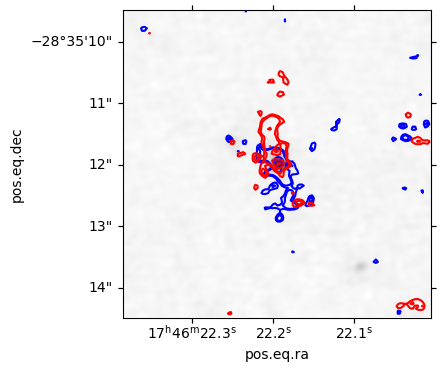

In [36]:
l = 5*u.arcsec
w = 5*u.arcsec
cutout_1 = cm.get_cutout(B6_cont_fn, position_core1, l, w, format='fits')
cutout_B3_1 = cm.get_cutout(B3_cont_fn, position_core1, l, w, format='casa')

cutout_outflow1_lowv = cm.get_cutout(SiO_mom0_fn_lowv, position_core1, l, w)
cutout_outflow1_highv = cm.get_cutout(SiO_mom0_fn_highv, position_core1, l, w)

cutout_outflow1_B3_lowv = cm.get_cutout(SiO_mom0_B3_fn_lowv, position_core1, l, w)
cutout_outflow1_B3_highv = cm.get_cutout(SiO_mom0_B3_fn_highv, position_core1, l, w)

fig = plt.figure(figsize=(4, 4))
ax = plt.subplot(111, projection=cutout_1.wcs)
im = ax.imshow(cutout_1.data, origin='lower', cmap='Greys')
ax.contour(cutout_outflow1_lowv.data, transform=ax.get_transform(cutout_outflow1_lowv.wcs), colors='blue', levels=get_percentile_list(cutout_outflow1_lowv.data))
ax.contour(cutout_outflow1_highv.data, transform=ax.get_transform(cutout_outflow1_highv.wcs), colors='red', levels=get_percentile_list(cutout_outflow1_highv.data))


/orange/adamginsburg/miniconda3/envs/python312/lib/python3.12/site-packages/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in scalar remainder
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


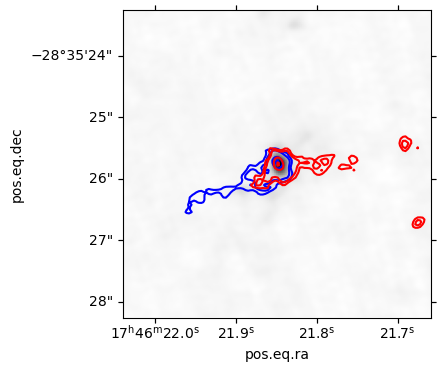

In [35]:
l = 5*u.arcsec
w = 5*u.arcsec
cutout_2 = cm.get_cutout(B6_cont_fn, position_core2, l, w, format='fits')
cutout_B3_2 = cm.get_cutout(B3_cont_fn, position_core2, l, w, format='casa')

cutout_outflow2_lowv = cm.get_cutout(SiO_mom0_fn_lowv, position_core2, l, w)
cutout_outflow2_highv = cm.get_cutout(SiO_mom0_fn_highv, position_core2, l, w)

cutout_outflow2_B3_lowv = cm.get_cutout(SiO_mom0_B3_fn_lowv, position_core2, l, w)
cutout_outflow2_B3_highv = cm.get_cutout(SiO_mom0_B3_fn_highv, position_core2, l, w)

fig = plt.figure(figsize=(4, 4))
ax = plt.subplot(111, projection=cutout_2.wcs)
im = ax.imshow(cutout_2.data, origin='lower', cmap='Greys')
ax.contour(cutout_outflow2_lowv.data, transform=ax.get_transform(cutout_outflow2_lowv.wcs), colors='blue', levels=get_percentile_list(cutout_outflow2_lowv.data))
ax.contour(cutout_outflow2_highv.data, transform=ax.get_transform(cutout_outflow2_highv.wcs), colors='red', levels=get_percentile_list(cutout_outflow2_highv.data))


/orange/adamginsburg/miniconda3/envs/python312/lib/python3.12/site-packages/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in scalar remainder
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


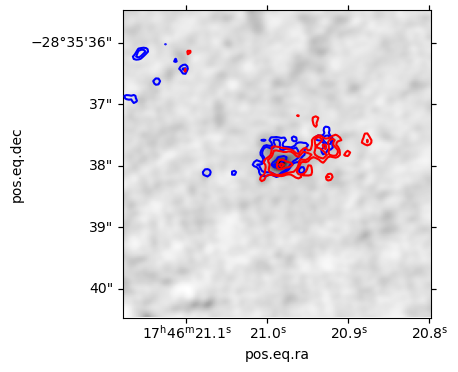

In [34]:
l = 5*u.arcsec
w = 5*u.arcsec
cutout_3 = cm.get_cutout(B6_cont_fn, position_core3, l, w, format='fits')
cutout_B3_3 = cm.get_cutout(B3_cont_fn, position_core3, l, w, format='casa')

cutout_outflow3_lowv = cm.get_cutout(SiO_mom0_fn_lowv, position_core3, l, w)
cutout_outflow3_highv = cm.get_cutout(SiO_mom0_fn_highv, position_core3, l, w)

cutout_outflow3_B3_lowv = cm.get_cutout(SiO_mom0_B3_fn_lowv, position_core3, l, w)
cutout_outflow3_B3_highv = cm.get_cutout(SiO_mom0_B3_fn_highv, position_core3, l, w)

fig = plt.figure(figsize=(4, 4))
ax = plt.subplot(111, projection=cutout_3.wcs)
im = ax.imshow(cutout_3.data, origin='lower', cmap='Greys')
ax.contour(cutout_outflow3_lowv.data, transform=ax.get_transform(cutout_outflow3_lowv.wcs), colors='blue', levels=get_percentile_list(cutout_outflow3_lowv.data))
ax.contour(cutout_outflow3_highv.data, transform=ax.get_transform(cutout_outflow3_highv.wcs), colors='red', levels=get_percentile_list(cutout_outflow3_highv.data))

In [12]:
ang = (0.3*u.pc/(8*u.kpc)).to(u.arcmin, equivalencies=u.dimensionless_angles())
ang

<Quantity 0.1289155 arcmin>

In [22]:
position_ctr = SkyCoord('17:46:21.3644986214', '-28:35:27.5072122119', unit=(u.hourangle, u.deg))
l = 45*u.arcsec
w = 45*u.arcsec
cutout_ctr = cm.get_cutout(B6_cont_fn, position_ctr, l, w)#, format='casa')
cutout_B3 = cm.get_cutout(B3_cont_fn, position_ctr, l, w, format='casa')
cutout_rgb, cutout_rgb_wcs = cm.get_cutout_rgb(position_ctr, l, w)
cutout_rgb3, cutout_rgb3_wcs = cm.get_cutout_rgb3(position_ctr, l, w)

/orange/adamginsburg/miniconda3/envs/python312/lib/python3.12/site-packages/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in scalar remainder
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


# Big Multipanel

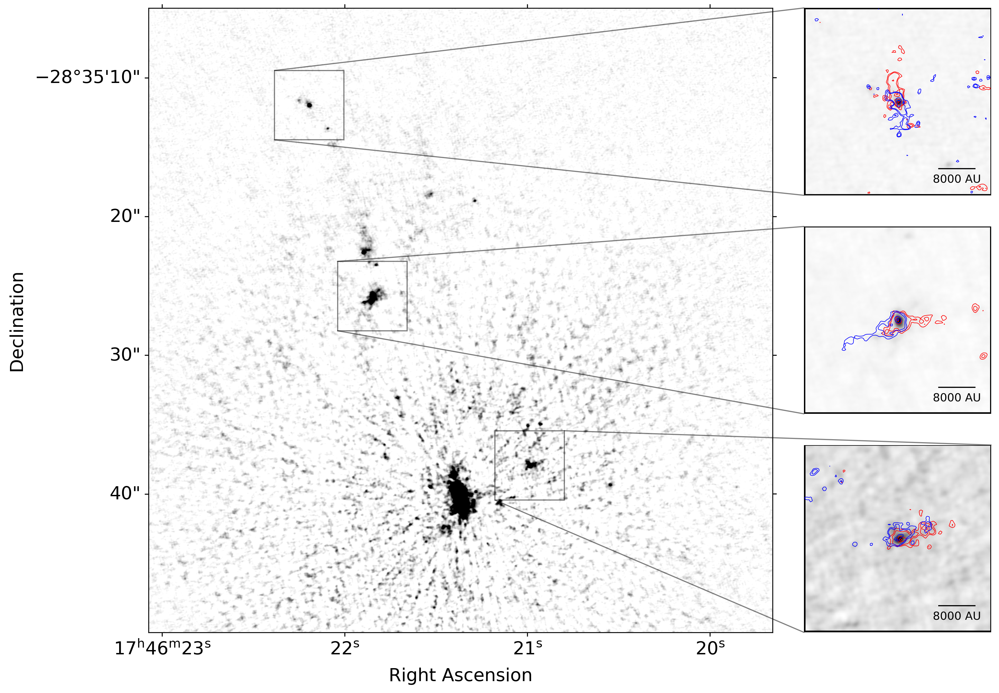

In [26]:
plt.figure(figsize=(24,10), dpi=300)
ax = plt.subplot(111, projection=cutout_ctr.wcs)#, origin='lower')
ax.imshow(cutout_ctr.data, cmap='Greys', vmin=0, vmax=0.0010193787049129536)

pixelscale = u.pixel_scale(proj_plane_pixel_scales(cutout_ctr.wcs)[0]*u.deg/u.pix)

ax.set_ylabel('Declination', fontproperties={"size": 16})
ax.set_xlabel('Right Ascension', fontproperties={"size": 16})

ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)


ins_ax_3 = ax.inset_axes([1.05, .0, .3, .3], projection=cutout_3.wcs) 
ins_ax_3.imshow(cutout_3.data, cmap='Greys')
ins_ax_3.set_axis_off()
pos3 = SkyCoord.to_pixel(position_core3, wcs=cutout_ctr.wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ins_ax_3.contour(cutout_outflow3_highv.data, transform=ins_ax_3.get_transform(cutout_outflow3_highv.wcs), 
           levels=get_percentile_list(cutout_outflow3_highv.data), 
           #levels=get_step_list(cutout_outflow1_highv.data),
           colors='red', linewidths=0.5)
ins_ax_3.contour(cutout_outflow3_lowv.data, transform=ins_ax_3.get_transform(cutout_outflow3_lowv.wcs), 
           levels=get_percentile_list(cutout_outflow3_lowv.data), 
           #levels=get_step_list(cutout_outflow1_lowv.data),
           colors='blue', linewidths=0.5)
add_scalebar(ins_ax_3, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
ax.indicate_inset(bounds=[pos3[0]-dx/2, pos3[1]-dx/2, dx, dx], inset_ax=ins_ax_3, edgecolor="black")
reg = regions.RectangleSkyRegion(position_core3, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_3.wcs)
pixel_region.plot(ax=ins_ax_3, color='k', linewidth=1.5)

ins_ax_2 = ax.inset_axes([1.05, .35, .3, .3], projection=cutout_2.wcs) 
ins_ax_2.imshow(cutout_2.data, cmap='Greys')
ins_ax_2.set_axis_off()
pos2 = SkyCoord.to_pixel(position_core2, wcs=cutout_ctr.wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ins_ax_2.contour(cutout_outflow2_highv.data, transform=ins_ax_2.get_transform(cutout_outflow2_highv.wcs), 
           levels=get_percentile_list(cutout_outflow2_highv.data), 
           #levels=get_step_list(cutout_outflow1_highv.data),
           colors='red', linewidths=0.5)
ins_ax_2.contour(cutout_outflow2_lowv.data, transform=ins_ax_2.get_transform(cutout_outflow2_lowv.wcs), 
           levels=get_percentile_list(cutout_outflow2_lowv.data), 
           #levels=get_step_list(cutout_outflow1_lowv.data),
           colors='blue', linewidths=0.5)
add_scalebar(ins_ax_2, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
ax.indicate_inset(bounds=[pos2[0]-dx/2, pos2[1]-dx/2, dx, dx], inset_ax=ins_ax_2, edgecolor="black")
reg = regions.RectangleSkyRegion(position_core2, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_2.wcs)
pixel_region.plot(ax=ins_ax_2, color='k', linewidth=1.5)

ins_ax_1 = ax.inset_axes([1.05, .7, .3, .3], projection=cutout_1.wcs) 
ins_ax_1.imshow(cutout_1.data, cmap='Greys')
ins_ax_1.set_axis_off()
pos1 = SkyCoord.to_pixel(position_core1, wcs=cutout_ctr.wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ins_ax_1.contour(cutout_outflow1_highv.data, transform=ins_ax_1.get_transform(cutout_outflow1_highv.wcs), 
           levels=get_percentile_list(cutout_outflow1_highv.data), 
           #levels=get_step_list(cutout_outflow1_highv.data),
           colors='red', linewidths=0.5)
ins_ax_1.contour(cutout_outflow1_lowv.data, transform=ins_ax_1.get_transform(cutout_outflow1_lowv.wcs), 
           levels=get_percentile_list(cutout_outflow1_lowv.data), 
           #levels=get_step_list(cutout_outflow1_lowv.data),
           colors='blue', linewidths=0.5)
add_scalebar(ins_ax_1, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
ax.indicate_inset(bounds=[pos1[0]-dx/2, pos1[1]-dx/2, dx, dx], inset_ax=ins_ax_1, edgecolor="black")
reg = regions.RectangleSkyRegion(position_core1, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_1.wcs)
pixel_region.plot(ax=ins_ax_1, color='k', linewidth=1.5)
print()
#plt.savefig('/orange/adamginsburg/jwst/cloudc/figures/band6_cont_context.pdf', bbox_inches='tight')
#plt.savefig('/orange/adamginsburg/jwst/cloudc/figures/band6_cont_context.png', bbox_inches='tight')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


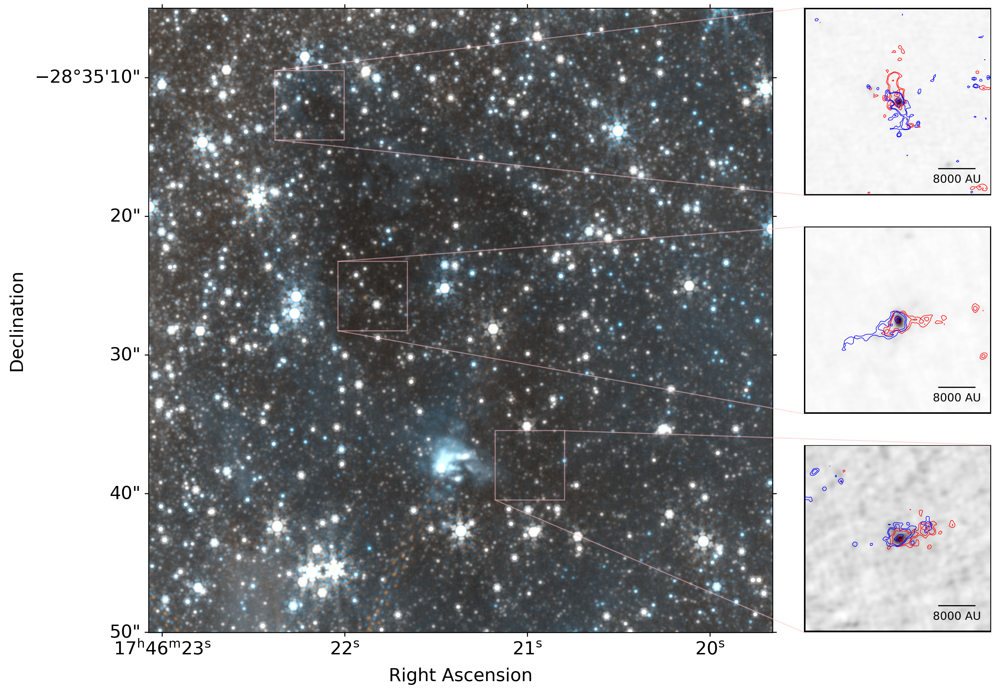

In [25]:
plt.figure(figsize=(24,10), dpi=300)
ax = plt.subplot(111, projection=cutout_rgb_wcs)#, origin='lower')
ax.imshow(cutout_rgb, cmap='Greys', vmin=0, vmax=0.0010193787049129536)

pixelscale = u.pixel_scale(proj_plane_pixel_scales(cutout_rgb_wcs)[0]*u.deg/u.pix)

ax.set_ylabel('Declination', fontproperties={"size": 16})
ax.set_xlabel('Right Ascension', fontproperties={"size": 16})

ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)


ins_ax_3 = ax.inset_axes([1.05, .0, .3, .3], projection=cutout_3.wcs) 
ins_ax_3.imshow(cutout_3.data, cmap='Greys')
ins_ax_3.set_axis_off()
pos3 = SkyCoord.to_pixel(position_core3, wcs=cutout_rgb_wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ins_ax_3.contour(cutout_outflow3_highv.data, transform=ins_ax_3.get_transform(cutout_outflow3_highv.wcs), 
           levels=get_percentile_list(cutout_outflow3_highv.data), 
           #levels=get_step_list(cutout_outflow1_highv.data),
           colors='red', linewidths=0.5)
ins_ax_3.contour(cutout_outflow3_lowv.data, transform=ins_ax_3.get_transform(cutout_outflow3_lowv.wcs), 
           levels=get_percentile_list(cutout_outflow3_lowv.data), 
           #levels=get_step_list(cutout_outflow1_lowv.data),
           colors='blue', linewidths=0.5)
add_scalebar(ins_ax_3, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
ax.indicate_inset(bounds=[pos3[0]-dx/2, pos3[1]-dx/2, dx, dx], inset_ax=ins_ax_3, edgecolor="pink")
reg = regions.RectangleSkyRegion(position_core3, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_3.wcs)
pixel_region.plot(ax=ins_ax_3, color='k', linewidth=1.5)

ins_ax_2 = ax.inset_axes([1.05, .35, .3, .3], projection=cutout_2.wcs) 
ins_ax_2.imshow(cutout_2.data, cmap='Greys')
ins_ax_2.set_axis_off()
pos2 = SkyCoord.to_pixel(position_core2, wcs=cutout_rgb_wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ins_ax_2.contour(cutout_outflow2_highv.data, transform=ins_ax_2.get_transform(cutout_outflow2_highv.wcs), 
           levels=get_percentile_list(cutout_outflow2_highv.data), 
           #levels=get_step_list(cutout_outflow1_highv.data),
           colors='red', linewidths=0.5)
ins_ax_2.contour(cutout_outflow2_lowv.data, transform=ins_ax_2.get_transform(cutout_outflow2_lowv.wcs), 
           levels=get_percentile_list(cutout_outflow2_lowv.data), 
           #levels=get_step_list(cutout_outflow1_lowv.data),
           colors='blue', linewidths=0.5)
add_scalebar(ins_ax_2, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
ax.indicate_inset(bounds=[pos2[0]-dx/2, pos2[1]-dx/2, dx, dx], inset_ax=ins_ax_2, edgecolor="pink")
reg = regions.RectangleSkyRegion(position_core2, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_2.wcs)
pixel_region.plot(ax=ins_ax_2, color='k', linewidth=1.5)

ins_ax_1 = ax.inset_axes([1.05, .7, .3, .3], projection=cutout_1.wcs) 
ins_ax_1.imshow(cutout_1.data, cmap='Greys')
ins_ax_1.set_axis_off()
pos1 = SkyCoord.to_pixel(position_core1, wcs=cutout_rgb_wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ins_ax_1.contour(cutout_outflow1_highv.data, transform=ins_ax_1.get_transform(cutout_outflow1_highv.wcs), 
           levels=get_percentile_list(cutout_outflow1_highv.data), 
           #levels=get_step_list(cutout_outflow1_highv.data),
           colors='red', linewidths=0.5)
ins_ax_1.contour(cutout_outflow1_lowv.data, transform=ins_ax_1.get_transform(cutout_outflow1_lowv.wcs), 
           levels=get_percentile_list(cutout_outflow1_lowv.data), 
           #levels=get_step_list(cutout_outflow1_lowv.data),
           colors='blue', linewidths=0.5)
add_scalebar(ins_ax_1, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
ax.indicate_inset(bounds=[pos1[0]-dx/2, pos1[1]-dx/2, dx, dx], inset_ax=ins_ax_1, edgecolor="pink")
reg = regions.RectangleSkyRegion(position_core1, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_1.wcs)
pixel_region.plot(ax=ins_ax_1, color='k', linewidth=1.5)
print()
#plt.savefig('/orange/adamginsburg/jwst/cloudc/figures/band6_cont_context.pdf', bbox_inches='tight')
#plt.savefig('/orange/adamginsburg/jwst/cloudc/figures/band6_cont_context.png', bbox_inches='tight')

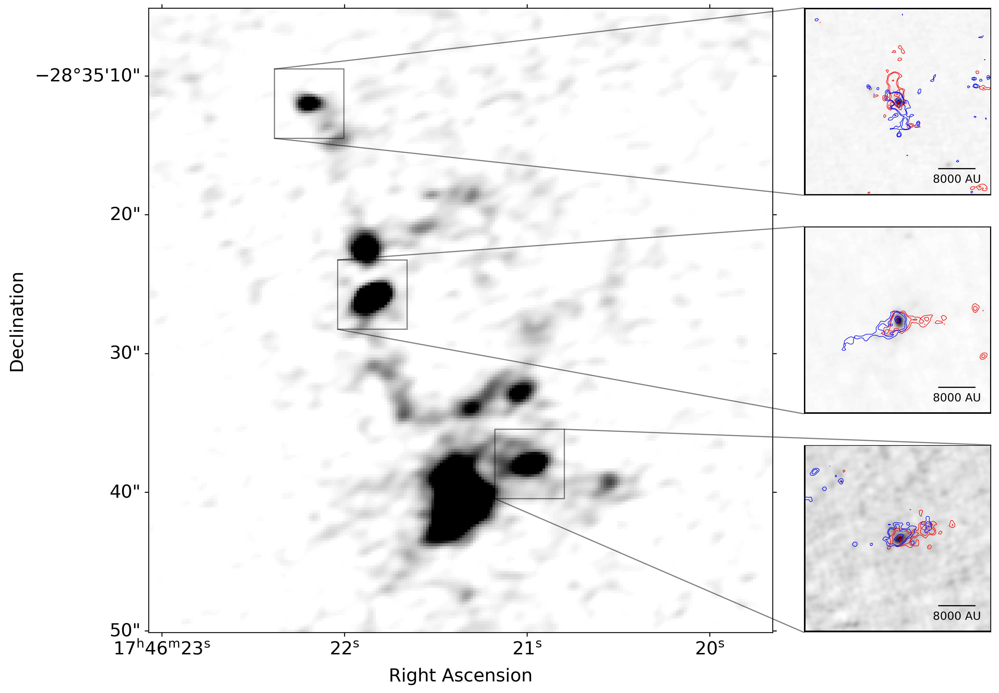

In [41]:
plt.figure(figsize=(24,10), dpi=300)
ax = plt.subplot(111, projection=cutout_B3.wcs)#, origin='lower')
ax.imshow(cutout_B3.data, cmap='Greys', vmin=0, vmax=0.0010193787049129536)

pixelscale = u.pixel_scale(proj_plane_pixel_scales(cutout_B3.wcs)[0]*u.deg/u.pix)

ax.set_ylabel('Declination', fontproperties={"size": 16})
ax.set_xlabel('Right Ascension', fontproperties={"size": 16})

ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)


ins_ax_3 = ax.inset_axes([1.05, .0, .3, .3], projection=cutout_3.wcs) 
ins_ax_3.imshow(cutout_3.data, cmap='Greys')
ins_ax_3.set_axis_off()
pos3 = SkyCoord.to_pixel(position_core3, wcs=cutout_B3.wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ins_ax_3.contour(cutout_outflow3_highv.data, transform=ins_ax_3.get_transform(cutout_outflow3_highv.wcs), 
           levels=get_percentile_list(cutout_outflow3_highv.data), 
           #levels=get_step_list(cutout_outflow1_highv.data),
           colors='red', linewidths=0.5)
ins_ax_3.contour(cutout_outflow3_lowv.data, transform=ins_ax_3.get_transform(cutout_outflow3_lowv.wcs), 
           levels=get_percentile_list(cutout_outflow3_lowv.data), 
           #levels=get_step_list(cutout_outflow1_lowv.data),
           colors='blue', linewidths=0.5)
add_scalebar(ins_ax_3, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
ax.indicate_inset(bounds=[pos3[0]-dx/2, pos3[1]-dx/2, dx, dx], inset_ax=ins_ax_3, edgecolor="black")
reg = regions.RectangleSkyRegion(position_core3, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_3.wcs)
pixel_region.plot(ax=ins_ax_3, color='k', linewidth=1.5)

ins_ax_2 = ax.inset_axes([1.05, .35, .3, .3], projection=cutout_2.wcs) 
ins_ax_2.imshow(cutout_2.data, cmap='Greys')
ins_ax_2.set_axis_off()
pos2 = SkyCoord.to_pixel(position_core2, wcs=cutout_B3.wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ins_ax_2.contour(cutout_outflow2_highv.data, transform=ins_ax_2.get_transform(cutout_outflow2_highv.wcs), 
           levels=get_percentile_list(cutout_outflow2_highv.data), 
           #levels=get_step_list(cutout_outflow1_highv.data),
           colors='red', linewidths=0.5)
ins_ax_2.contour(cutout_outflow2_lowv.data, transform=ins_ax_2.get_transform(cutout_outflow2_lowv.wcs), 
           levels=get_percentile_list(cutout_outflow2_lowv.data), 
           #levels=get_step_list(cutout_outflow1_lowv.data),
           colors='blue', linewidths=0.5)
add_scalebar(ins_ax_2, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
ax.indicate_inset(bounds=[pos2[0]-dx/2, pos2[1]-dx/2, dx, dx], inset_ax=ins_ax_2, edgecolor="black")
reg = regions.RectangleSkyRegion(position_core2, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_2.wcs)
pixel_region.plot(ax=ins_ax_2, color='k', linewidth=1.5)

ins_ax_1 = ax.inset_axes([1.05, .7, .3, .3], projection=cutout_1.wcs) 
ins_ax_1.imshow(cutout_1.data, cmap='Greys')
ins_ax_1.set_axis_off()
pos1 = SkyCoord.to_pixel(position_core1, wcs=cutout_B3.wcs)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
ins_ax_1.contour(cutout_outflow1_highv.data, transform=ins_ax_1.get_transform(cutout_outflow1_highv.wcs), 
           levels=get_percentile_list(cutout_outflow1_highv.data), 
           #levels=get_step_list(cutout_outflow1_highv.data),
           colors='red', linewidths=0.5)
ins_ax_1.contour(cutout_outflow1_lowv.data, transform=ins_ax_1.get_transform(cutout_outflow1_lowv.wcs), 
           levels=get_percentile_list(cutout_outflow1_lowv.data), 
           #levels=get_step_list(cutout_outflow1_lowv.data),
           colors='blue', linewidths=0.5)
add_scalebar(ins_ax_1, u.Quantity(1*u.arcsec), label="8000 AU", color='k', fontproperties={"size": 10})
ax.indicate_inset(bounds=[pos1[0]-dx/2, pos1[1]-dx/2, dx, dx], inset_ax=ins_ax_1, edgecolor="black")
reg = regions.RectangleSkyRegion(position_core1, 4.99*u.arcsec, 4.99*u.arcsec)
pixel_region = reg.to_pixel(cutout_1.wcs)
pixel_region.plot(ax=ins_ax_1, color='k', linewidth=1.5)
print()
#plt.savefig('/orange/adamginsburg/jwst/cloudc/figures/band6_cont_context.pdf', bbox_inches='tight')
#plt.savefig('/orange/adamginsburg/jwst/cloudc/figures/band6_cont_context.png', bbox_inches='tight')